In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
emicron = pd.read_csv("../../Data/emicron_index.csv")

In [3]:
department = {
    5: "Antioquia",
    8: "Atlántico",
    11: "Bogotá, D. C.",
    13: "Bolívar",
    15: "Boyacá",
    17: "Caldas",
    18: "Caquetá",
    19: "Cauca",
    20: "Cesar",
    23: "Córdoba",
    25: "Cundinamarca",
    27: "Chocó",
    41: "Huila",
    44: "La Guajira",
    47: "Magdalena",
    50: "Meta",
    52: "Nariño",
    54: "Norte De Santander",
    63: "Quindío",
    66: "Risaralda",
    68: "Santander",
    70: "Sucre",
    73: "Tolima",
    76: "Valle Del Cauca",
    88: "Archipiélago de San Andrés, Providencia y Santa Catalina"}

In [4]:
emicron['dept_name'] = emicron['COD_DEPTO'].map(department)

In [5]:
# P35: dummy for male/female

weighted_total_counts_by_dept = emicron.groupby("dept_name")["F_EXP"].sum()

# Calculate the weighted number of males for each department
weighted_male_counts_by_dept = emicron[emicron['P35'] == 1].groupby("dept_name")['F_EXP'].sum()

# Calculate the percentage of males for each department with expansion factors
percentage_males_by_dept = (weighted_male_counts_by_dept / weighted_total_counts_by_dept) * 100

In [6]:
percentage_males_by_dept

dept_name
Antioquia                                                   67.164084
Archipiélago de San Andrés, Providencia y Santa Catalina    76.772972
Atlántico                                                   60.341012
Bogotá, D. C.                                               65.942991
Bolívar                                                     70.216875
Boyacá                                                      62.473742
Caldas                                                      67.170134
Caquetá                                                     68.587194
Cauca                                                       70.220548
Cesar                                                       71.162732
Chocó                                                       69.656109
Cundinamarca                                                62.077288
Córdoba                                                     68.373891
Huila                                                       70.911536
La Guajira

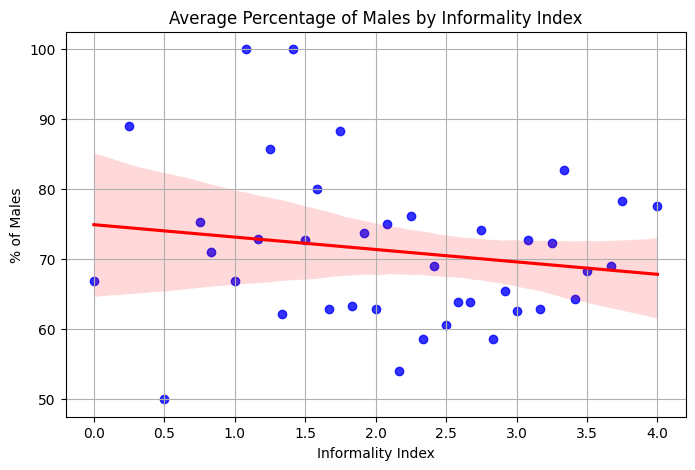

In [7]:
# Count the total number of observations for each value of II
total_counts_by_II = emicron['II'].value_counts()

# Count the number of males for each value of II
male_counts_by_II = emicron[emicron['P35'] == 1]['II'].value_counts()

# Calculate the percentage of males for each value of II
percentage_males_by_II = (male_counts_by_II / total_counts_by_II) * 100

# Create a DataFrame for seaborn
data = pd.DataFrame({'II': percentage_males_by_II.index, '% of Males': percentage_males_by_II.values})

# Plot the scatter plot with regression line and confidence interval
plt.figure(figsize=(8, 5))
sns.regplot(x='II', y='% of Males', data=data, ci=95, line_kws={"color":"red"}, scatter_kws={"color":"blue"})
plt.xlabel('Informality Index')
plt.ylabel('% of Males')
plt.title('Average Percentage of Males by Informality Index')
plt.grid(True)
plt.show()

In [8]:
# CLASE_TE: dummy for rural/urban

weighted_total_counts_by_dept = emicron.groupby("dept_name")["F_EXP"].sum()

# Calculate the weighted number of rural firms for each department
weighted_rural_counts_by_dept = emicron[emicron['CLASE_TE'] == 2].groupby("dept_name")["F_EXP"].sum()

# Calculate the percentage of rural firms for each department with expansion factors
percentage_rural_by_dept = (weighted_rural_counts_by_dept / weighted_total_counts_by_dept) * 100

In [9]:
percentage_rural_by_dept

dept_name
Antioquia                                                   20.111593
Archipiélago de San Andrés, Providencia y Santa Catalina          NaN
Atlántico                                                    6.955487
Bogotá, D. C.                                                0.254163
Bolívar                                                     32.889983
Boyacá                                                      42.066070
Caldas                                                      23.608071
Caquetá                                                     39.132498
Cauca                                                       71.226897
Cesar                                                       20.921064
Chocó                                                       48.309659
Cundinamarca                                                24.472444
Córdoba                                                     57.109914
Huila                                                       43.836133
La Guajira

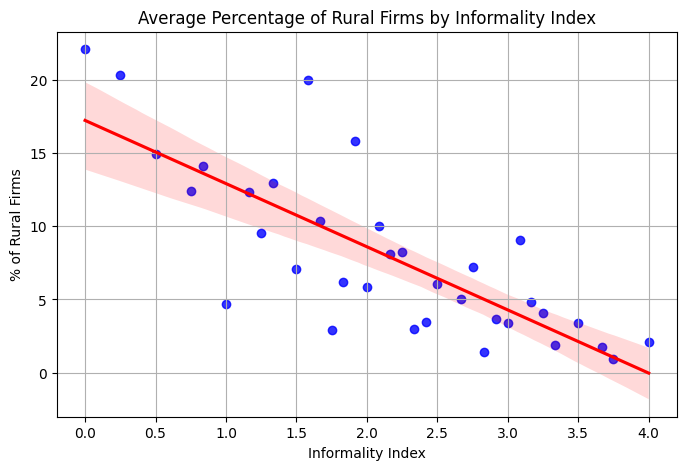

In [10]:
# Count the total number of observations for each value of II
total_counts_by_II = emicron['II'].value_counts()

# Count the number of rural firms for each value of II
rural_counts_by_II = emicron[emicron['CLASE_TE'] == 2]['II'].value_counts()

# Calculate the percentage of rural firms for each value of II
percentage_rural_by_II = (rural_counts_by_II / total_counts_by_II) * 100

# Create a DataFrame for seaborn
data = pd.DataFrame({'II': percentage_rural_by_II.index, '% of Rural Firms': percentage_rural_by_II.values})

# Plot the scatter plot with regression line and confidence interval
plt.figure(figsize=(8, 5))
sns.regplot(x='II', y='% of Rural Firms', data=data, ci=95, line_kws={"color":"red"}, scatter_kws={"color":"blue"})
plt.xlabel('Informality Index')
plt.ylabel('% of Rural Firms')
plt.title('Average Percentage of Rural Firms by Informality Index')
plt.grid(True)
plt.show()

In [11]:
# P3032_3: dummy for unpain workers

emicron['dummy_unpaid'] = np.where(
    emicron['P3032_3'].isnull(),  # Check for null in P3032_3
    np.nan,  # Set to null if P3032_3 is null
    np.where(emicron['P3032_3'] == 0, 0, 1)  # Set to 0 if P3032_3 is 0, otherwise set to 1
)

In [12]:
filtered_emicron = emicron.dropna(subset=['dummy_unpaid'])

# Calculate the weighted number of firms with unpaid workers for each department
weighted_unpaid_counts_by_dept = (filtered_emicron["dummy_unpaid"] * filtered_emicron["F_EXP"]).groupby(filtered_emicron["dept_name"]).sum()

# Calculate the weighted total number of firms for each department
weighted_total_counts_by_dept = filtered_emicron.groupby("dept_name")["F_EXP"].sum()

# Calculate the percentage of firms with unpaid workers for each department with expansion factors
unpaid = (weighted_unpaid_counts_by_dept / weighted_total_counts_by_dept) * 100

In [13]:
unpaid

dept_name
Antioquia                                                   15.008092
Archipiélago de San Andrés, Providencia y Santa Catalina     7.090898
Atlántico                                                   26.873096
Bogotá, D. C.                                               18.841900
Bolívar                                                     30.354813
Boyacá                                                      33.333194
Caldas                                                      21.607960
Caquetá                                                     59.036148
Cauca                                                       52.005012
Cesar                                                       27.184489
Chocó                                                       44.763859
Cundinamarca                                                20.170265
Córdoba                                                     53.519833
Huila                                                       47.415008
La Guajira

In [14]:
migracion = pd.read_stata("../../Data/migration_geih-2022-clean.dta")
ocupados = pd.read_stata("../../Data/occupied_geih-2022-clean.dta")
personas = pd.read_stata("../../Data/household_geih-2022-clean.dta")

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3829832622.py:1: UnicodeWarning: 
One or more strings in the dta file could not be decoded using utf-8, and
so the fallback encoding of latin-1 is being used.  This can happen when a file
has been incorrectly encoded by Stata or some other software. You should verify
the string values returned are correct.
  migracion = pd.read_stata("../../Data/migration_geih-2022-clean.dta")
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3829832622.py:2: UnicodeWarning: 
One or more strings in the dta file could not be decoded using utf-8, and
so the fallback encoding of latin-1 is being used.  This can happen when a file
has been incorrectly encoded by Stata or some other software. You should verify
the string values returned are correct.
  ocupados = pd.read_stata("../../Data/occupied_geih-2022-clean.dta")
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3829832622.py:3: UnicodeWarning: 
One or more s

In [15]:
migracion["DPTO"].unique()

array(['08', '13', '25', '18', '15', '76', '63', '66', '05', '11', '17',
       '19', '20', '23', '41', '44', '50', '52', '54', '68', '70', '85',
       '86', '94', '95', '97', '73', '81', '88', '27', '47', '91', '99'],
      dtype=object)

In [16]:
department_codes = {
    5: 'ANTIOQUIA',
    8: 'ATLANTICO',
    11: 'BOGOTA',
    13: 'BOLIVAR',
    15: 'BOYACA',
    17: 'CALDAS',
    18: 'CAQUETA',
    19: 'CAUCA',
    20: 'CESAR',
    23: 'CORDOBA',
    25: 'CUNDINAMARCA',
    27: 'CHOCO',
    41: 'HUILA',
    44: 'LA GUAJIRA',
    47: 'MAGDALENA',
    50: 'META',
    52: 'NARIÑO',
    54: 'NORTE DE SANTANDER',
    63: 'QUINDIO',
    66: 'RISALRALDA',
    68: 'SANTANDER',
    70: 'SUCRE',
    73: 'TOLIMA',
    76: 'VALLE',
    81: 'ARAUCA',
    85: 'CASANARE',
    86: 'PUTUMAYO',
    88: 'SAN ANDRES',
    91: 'AMAZONAS',
    94: 'GUAINIA',
    95: 'GUAVIARE',
    97: 'VAUPES',
    99: 'VICHADA'}

In [17]:
migracion["DPTO"] = migracion["DPTO"].astype(int)

In [18]:
migracion['dept_name'] = migracion['DPTO'].map(department_codes)

In [19]:
migracion[["DPTO","dept_name"]]

,DPTO,dept_name
0,8,ATLANTICO
1,8,ATLANTICO
2,8,ATLANTICO
3,8,ATLANTICO
4,8,ATLANTICO
...,...,...
919454,99,VICHADA
919455,99,VICHADA
919456,99,VICHADA
919457,99,VICHADA


In [20]:
# P3373: categorical variable for birthplace (3 - 'in another country')
migracion['migrant_dummy'] = np.where(migracion['P3373'] == 3, 1, 0)

In [21]:
migrants = migracion.groupby("dept_name")["migrant_dummy"].mean()*100

In [22]:
migrants

dept_name
AMAZONAS               1.376488
ANTIOQUIA              5.463654
ARAUCA                18.459858
ATLANTICO              7.224156
BOGOTA                 5.526964
BOLIVAR                5.663978
BOYACA                 2.744392
CALDAS                 2.333445
CAQUETA                0.907928
CASANARE               9.025760
CAUCA                  2.618658
CESAR                  6.720840
CHOCO                  1.074014
CORDOBA                1.716297
CUNDINAMARCA           5.299844
GUAINIA               14.198141
GUAVIARE               3.625783
HUILA                  1.751527
LA GUAJIRA            12.588545
MAGDALENA              7.866673
META                   4.247877
NARIÑO                 1.385936
NORTE DE SANTANDER    13.620726
PUTUMAYO               5.486344
QUINDIO                4.156354
RISALRALDA             5.017345
SAN ANDRES             0.910760
SANTANDER              6.445385
SUCRE                  2.706175
TOLIMA                 2.377439
VALLE                  4.80584

In [23]:
migrants_df = migracion[migracion['P3373'] == 3]

# Group the filtered dataframe by department
grouped_migrants = migrants_df.groupby('dept_name')

# Count the number of migrants from Venezuela (P3373S3 = 862) for each department
migrants_from_venezuela_by_dept = grouped_migrants['P3373S3'].apply(lambda x: (x == 862).sum())

# Calculate the percentage for each department
total_migrants_by_dept = grouped_migrants.size()
percentage_from_venezuela_by_dept = (migrants_from_venezuela_by_dept / total_migrants_by_dept) * 100

print("Percentage of migrants from Venezuela by department:")
print(percentage_from_venezuela_by_dept)

Percentage of migrants from Venezuela by department:
dept_name
AMAZONAS               5.405405
ANTIOQUIA             93.598616
ARAUCA                98.619329
ATLANTICO             97.846890
BOGOTA                89.704918
BOLIVAR               96.929638
BOYACA                94.272076
CALDAS                87.975334
CAQUETA               89.788732
CASANARE              98.927039
CAUCA                 91.627358
CESAR                 98.341336
CHOCO                 94.567901
CORDOBA               93.230174
CUNDINAMARCA          95.804989
GUAINIA               97.632312
GUAVIARE              97.530864
HUILA                 91.771020
LA GUAJIRA            99.454744
MAGDALENA             96.916158
META                  95.152722
NARIÑO                72.537879
NORTE DE SANTANDER    99.455994
PUTUMAYO              98.253275
QUINDIO               89.615105
RISALRALDA            87.595323
SAN ANDRES            26.356589
SANTANDER             97.293396
SUCRE                 97.823937
TOLIMA   

In [24]:
# P6440: ¿Para realizar este trabajo tiene … algún tipo de contrato? (verbal o escrito) 
# P6450: ¿El contrato es verbal o escrito? 
ocupados[["P6440", "P6450"]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382461 entries, 0 to 382460
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   P6440   382461 non-null  float64
 1   P6450   223862 non-null  float64
dtypes: float64(2)
memory usage: 5.8 MB


In [25]:
ocupados["P6440"].value_counts()

P6440
1.0    223862
2.0    158599
Name: count, dtype: int64

In [26]:
# P7170S1: ¿Está ... satisfecho: Con su trabajo actual?
ocupados["P7170S1"].value_counts()

P7170S1
1.0    324385
2.0     58076
Name: count, dtype: int64

In [27]:
# P514: ¿Considera que su empleo o trabajo actual es estable? 
ocupados["P514"].value_counts()

P514
1.0    257487
2.0    124974
Name: count, dtype: int64

In [28]:
merged = pd.read_csv("../../Data/emicron_geih_merged.csv")

In [29]:
merged['dept_name'] = merged['COD_DEPTO'].map(department)

In [30]:
# P3373: Dónde nació ... (1- in this municipality, 2-in another municipality, 3-in another country)
merged["P3373"].value_counts()

P3373
1.0    41758
2.0    32087
3.0     3761
Name: count, dtype: int64

In [31]:
merged['migrant_owner'] = np.where(merged['P3373'] == 3, 1, np.where(merged['P3373'].isin([1, 2]), 0, np.nan))

In [32]:
filtered_merged = merged.dropna(subset=['migrant_owner'])

# Calculate the weighted number of firms with migrant owners for each department
weighted_mig_counts_by_dept = (filtered_merged["migrant_owner"] * filtered_merged["F_EXP"]).groupby(filtered_merged["dept_name"]).sum()

# Calculate the weighted total number of firms for each department
weighted_total_counts_by_dept = filtered_merged.groupby("dept_name")["F_EXP"].sum()

# Calculate the percentage of firms with migrant owners for each department with expansion factors
migrant_owners = (weighted_mig_counts_by_dept / weighted_total_counts_by_dept) * 100

In [33]:
migrant_owners

dept_name
Antioquia                                                    4.844032
Archipiélago de San Andrés, Providencia y Santa Catalina     1.203312
Atlántico                                                    7.219696
Bogotá, D. C.                                                6.317479
Bolívar                                                      3.844977
Boyacá                                                       1.391096
Caldas                                                       1.785792
Caquetá                                                      0.694150
Cauca                                                        0.666530
Cesar                                                        4.990327
Chocó                                                        1.060128
Cundinamarca                                                 4.849383
Córdoba                                                      1.031085
Huila                                                        1.158657
La Guajira

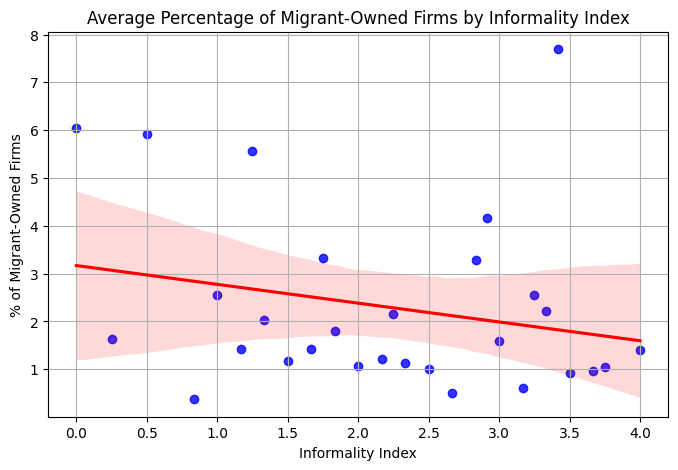

In [34]:
# Count the total number of observations for each value of II
total_counts_by_II = merged['II'].value_counts()

# Count the number of migrant owners for each value of II
owner_counts_by_II = merged[merged['P3373'] == 3]['II'].value_counts()

# Calculate the percentage of migrant owners for each value of II
percentage_onwer_by_II = (owner_counts_by_II / total_counts_by_II) * 100

# Create a DataFrame for seaborn
data = pd.DataFrame({'II': percentage_onwer_by_II.index, '% of Migrant-Owned Firms': percentage_onwer_by_II.values})

# Plot the scatter plot with regression line and confidence interval
plt.figure(figsize=(8, 5))
sns.regplot(x='II', y='% of Migrant-Owned Firms', data=data, ci=95, line_kws={"color":"red"}, scatter_kws={"color":"blue"})
plt.xlabel('Informality Index')
plt.ylabel('% of Migrant-Owned Firms')
plt.title('Average Percentage of Migrant-Owned Firms by Informality Index')
plt.grid(True)
plt.show()

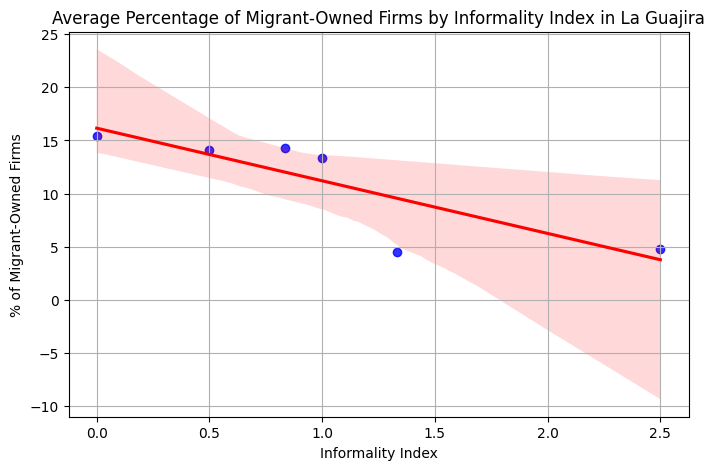

In [35]:
# restricting analysis to firms in La Guajira
f = merged[merged["dept_name"]=="La Guajira"]

# Count the total number of observations for each value of II
total_counts_by_II = f['II'].value_counts()

# Count the number of migrant owners for each value of II
owner_counts_by_II = f[f['P3373'] == 3]['II'].value_counts()

# Calculate the percentage of migrant owners for each value of II
percentage_onwer_by_II = (owner_counts_by_II / total_counts_by_II) * 100

# Create a DataFrame for seaborn
data = pd.DataFrame({'II': percentage_onwer_by_II.index, '% of Migrant-Owned Firms': percentage_onwer_by_II.values})

# Plot the scatter plot with regression line and confidence interval
plt.figure(figsize=(8, 5))
sns.regplot(x='II', y='% of Migrant-Owned Firms', data=data, ci=95, line_kws={"color":"red"}, scatter_kws={"color":"blue"})
plt.xlabel('Informality Index')
plt.ylabel('% of Migrant-Owned Firms')
plt.title('Average Percentage of Migrant-Owned Firms by Informality Index in La Guajira')
plt.grid(True)
plt.show()

In [36]:
# P7170S1: dummy for satisfaction with work
merged["dummy_sat"]=np.where(merged["P7170S1"]==1, 1, 0)

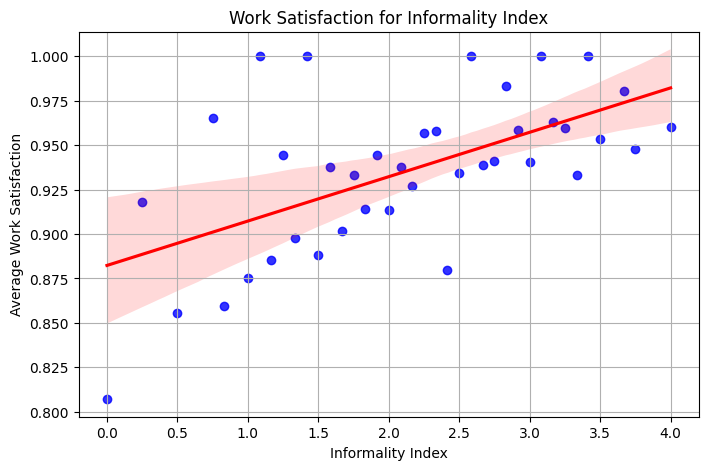

In [37]:
# Group the DataFrame by II and calculate the average of the dummy variable
average_dummy_by_II = merged.groupby('II')['dummy_sat'].mean().reset_index()

# Create a scatter plot with regression line
plt.figure(figsize=(8, 5))
sns.regplot(x='II', y='dummy_sat', data=average_dummy_by_II, scatter=True, ci=95, line_kws={"color":"red"}, scatter_kws={"color":"blue"})
plt.xlabel('Informality Index')
plt.ylabel('Average Work Satisfaction')
plt.title('Work Satisfaction for Informality Index')
plt.grid(True)
plt.show()

In [38]:
reasons = {
    1:"No other alternative",
    2:"Business Opportunity",
    3:"Family Tradition",
    4:"Income supplement",
    5:"Career",
    6:"Not enough experience/education",
    7:"Other"
}

In [39]:
# P3051: reason for starting business
merged["P3051"]=merged["P3051"].astype(int).map(reasons)

In [40]:
dF = pd.DataFrame(round(merged.groupby("P3051")["dummy_sat"].mean()*100, 2))
dF = dF.rename(columns={'dummy_sat': '% of Satisfied Owners'})
dF.index.name = 'Reason for Starting Business'

In [41]:
dF

,% of Satisfied Owners
Reason for Starting Business,
Business Opportunity,86.96
Career,90.96
Family Tradition,88.78
Income supplement,83.50
No other alternative,79.08
Not enough experience/education,81.82
Other,91.05


In [42]:
satisfaction = merged.groupby("dept_name")["dummy_sat"].mean()*100

In [43]:
weighted_sat_counts_by_dept = (merged["dummy_sat"] * merged["F_EXP"]).groupby(merged["dept_name"]).sum()

# Calculate the weighted total number of firms for each department
weighted_total_counts_by_dept = merged.groupby("dept_name")["F_EXP"].sum()

# Calculate the percentage of firms with satisfied owners for each department with expansion factors
satisfaction = (weighted_sat_counts_by_dept / weighted_total_counts_by_dept) * 100

In [44]:
satisfaction

dept_name
Antioquia                                                   90.967345
Archipiélago de San Andrés, Providencia y Santa Catalina    98.039661
Atlántico                                                   83.386639
Bogotá, D. C.                                               86.465226
Bolívar                                                     69.816934
Boyacá                                                      87.825702
Caldas                                                      94.234933
Caquetá                                                     88.567184
Cauca                                                       87.374931
Cesar                                                       78.754900
Chocó                                                       93.512819
Cundinamarca                                                88.832869
Córdoba                                                     77.499719
Huila                                                       87.067062
La Guajira

In [45]:
# P514: dummy for finding the job stable
merged["dummy_stab"]=np.where(merged["P514"]==1, 1, 0)

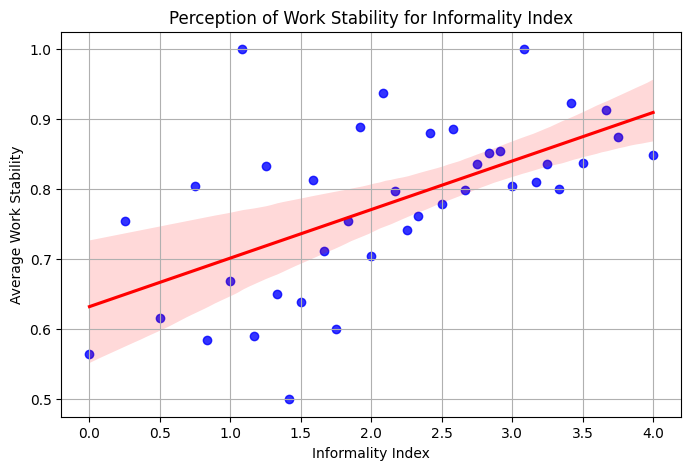

In [46]:
# Group the DataFrame by II and calculate the average of the dummy variable
average_dummy_by_II = merged.groupby('II')['dummy_stab'].mean().reset_index()

# Create a scatter plot with regression line
plt.figure(figsize=(8, 5))
sns.regplot(x='II', y='dummy_stab', data=average_dummy_by_II, scatter=True, ci=95, line_kws={"color":"red"}, scatter_kws={"color":"blue"})
plt.xlabel('Informality Index')
plt.ylabel('Average Work Stability')
plt.title('Perception of Work Stability for Informality Index')
plt.grid(True)
plt.show()

In [47]:
dF = pd.DataFrame(round(merged.groupby("P3051")["dummy_stab"].mean()*100, 2))
dF = dF.rename(columns={'dummy_stab': '% of Owners Perceiving Stable Jobs'})
dF.index.name = 'Reason for Starting Business'

In [48]:
dF

,% of Owners Perceiving Stable Jobs
Reason for Starting Business,
Business Opportunity,66.80
Career,65.93
Family Tradition,66.16
Income supplement,58.51
No other alternative,55.64
Not enough experience/education,56.69
Other,66.00


In [49]:
weighted_stab_counts_by_dept = (merged["dummy_stab"] * merged["F_EXP"]).groupby(merged["dept_name"]).sum()

# Calculate the weighted total number of firms for each department
weighted_total_counts_by_dept = merged.groupby("dept_name")["F_EXP"].sum()

stability = (weighted_stab_counts_by_dept / weighted_total_counts_by_dept) * 100

In [50]:
stability

dept_name
Antioquia                                                   72.590160
Archipiélago de San Andrés, Providencia y Santa Catalina    88.106814
Atlántico                                                   61.305995
Bogotá, D. C.                                               64.666366
Bolívar                                                     63.414513
Boyacá                                                      50.839370
Caldas                                                      84.288953
Caquetá                                                     67.772812
Cauca                                                       64.371165
Cesar                                                       55.181851
Chocó                                                       80.590799
Cundinamarca                                                60.087785
Córdoba                                                     51.732542
Huila                                                       63.502508
La Guajira

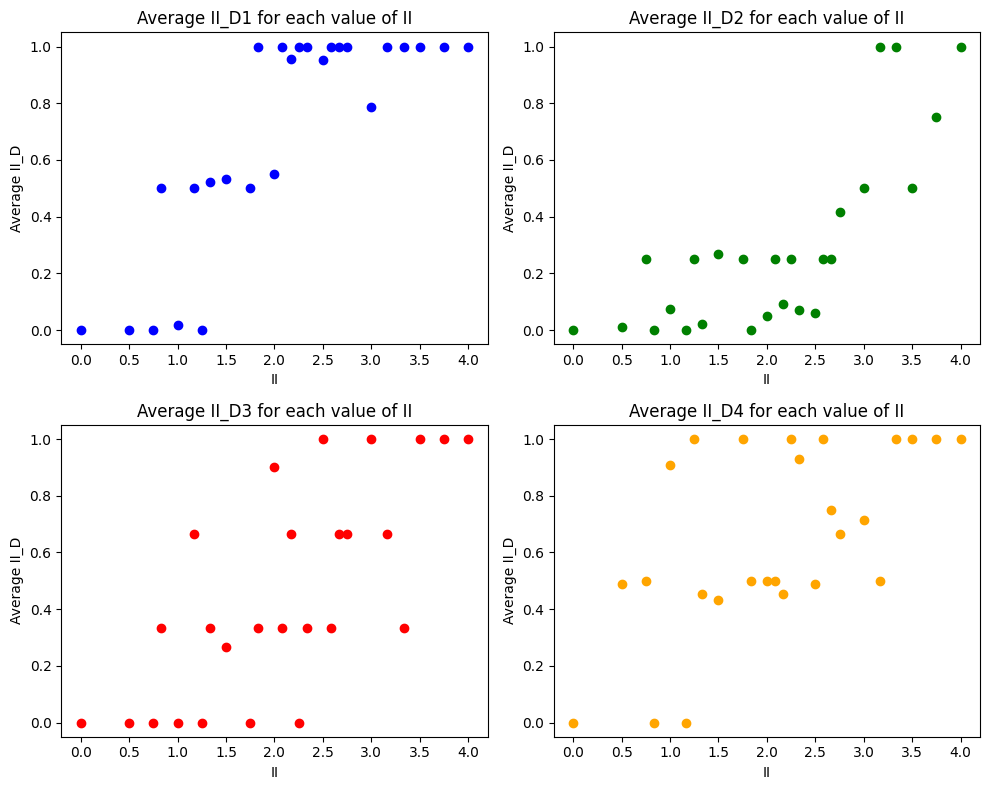

In [51]:
# Calculate the average of each II_D variable grouped by II - filtering on La Guajira
average_by_II = merged[merged["dept_name"]=="La Guajira"].groupby('II')[['II_D1', 'II_D2', 'II_D3', 'II_D4']].mean()

fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# Flatten the axs array for easier indexing
axs = axs.flatten()

# Define colors for each II_D variable
colors = ['blue', 'green', 'red', 'orange']

# Plot each II_D variable on a separate subplot with different colors
for i, (ii_d, color) in enumerate(zip(average_by_II.columns, colors)):
    axs[i].scatter(average_by_II.index, average_by_II[ii_d], color=color)
    axs[i].set_title(f'Average {ii_d} for each value of II')
    axs[i].set_xlabel('II')
    axs[i].set_ylabel('Average II_D')

# Adjust layout
plt.tight_layout()

# Show plots
plt.show()

In [52]:
total_firms = len(merged[merged["migrant_owner"] == 1])

# Calculate the count of firms for each reason for starting business
count_by_reason = merged[merged["migrant_owner"] == 1]["P3051"].value_counts()

# Convert the count to percentages
percent_by_reason = round((count_by_reason / total_firms) * 100,2)

# Create a DataFrame with the percentages
df = pd.DataFrame(percent_by_reason).rename(columns={'count': '% of Migrant-Owned Firms'})

# Rename the index
df.index.name = 'Reason for Starting Business'

In [53]:
df

,% of Migrant-Owned Firms
Reason for Starting Business,
No other alternative,54.72
Business Opportunity,24.83
Career,11.25
Income supplement,5.96
Family Tradition,2.37
Not enough experience/education,0.53
Other,0.35


In [54]:
total_firms = len(merged[merged["migrant_owner"] == 0])

# Calculate the count of firms for each reason for starting business
count_by_reason = merged[merged["migrant_owner"] == 0]["P3051"].value_counts()

# Convert the count to percentages
percent_by_reason = round((count_by_reason / total_firms) * 100,2)

# Create a DataFrame with the percentages
df = pd.DataFrame(percent_by_reason).rename(columns={'count': '% of Colombian-Owned Firms'})

# Rename the index
df.index.name = 'Reason for Starting Business'

In [55]:
df

,% of Colombian-Owned Firms
Reason for Starting Business,
No other alternative,36.61
Business Opportunity,31.30
Career,13.11
Income supplement,8.56
Family Tradition,7.97
Not enough experience/education,1.86
Other,0.59


In [56]:
dt = merged[merged["migrant_owner"] == 1].groupby("COD_DEPTO")['II'].mean()

In [57]:
dt

COD_DEPTO
5     0.315248
8     0.250473
11    0.449438
13    0.094818
15    0.621528
17    0.434641
18    0.225806
19    0.271429
20    0.223577
23    0.241667
25    0.400000
27    0.044444
41    0.287500
44    0.111013
47    0.102416
50    0.258578
52    0.442857
54    0.346881
63    0.375000
66    0.397436
68    0.300893
70    0.061404
73    0.817568
76    0.448643
88    2.768519
Name: II, dtype: float64

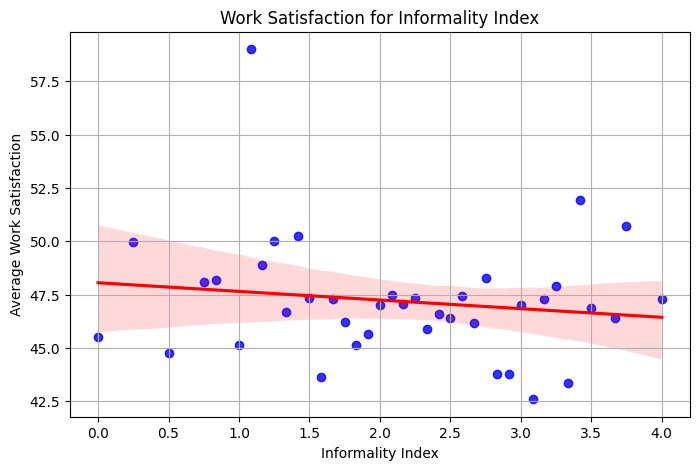

In [58]:
# Group the DataFrame by II and calculate the average of the dummy variable
average_dummy_by_II = merged.groupby('II')['P241'].mean().reset_index()

# Create a scatter plot with regression line
plt.figure(figsize=(8, 5))
sns.regplot(x='II', y='P241', data=average_dummy_by_II, scatter=True, ci=95, line_kws={"color":"red"}, scatter_kws={"color":"blue"})
plt.xlabel('Informality Index')
plt.ylabel('Average Work Satisfaction')
plt.title('Work Satisfaction for Informality Index')
plt.grid(True)
plt.show()

In [59]:
mpi = pd.read_stata("../../Data/02_emicron-informality-mpi.dta")

In [60]:
mpi.columns

Index(['DPTO', 'urban', 'AREA', 'id_house', 'id_per', 'adj_weight', 'II_D1',
       'II_D2', 'II_D3', 'II_D4', 'II', 'mpi_index', 'mpi_poor', 'mpi_water',
       'mpi_excrete', 'mpi_floor', 'mpi_walls', 'mpi_overcrowding',
       'mpi_housing', 'mpi_eco_dep', 'mpi_inf_work', 'mpi_labour',
       'mpi_edu_years', 'mpi_literacy', 'mpi_education', 'mpi_edu_attend',
       'mpi_school_lag', 'mpi_care_barriers', 'mpi_child_labour', 'mpi_cy',
       'mpi_health_ss', 'mpi_deprivations', 'VENTAS_ANIO_ANTERIOR',
       'COSTOS_ANIO_ANTERIOR', 'CONSUMO_INTERMEDIO', 'GASTOS_MES',
       'VALOR_AGREGADO', 'INGRESO_MIXTO', 'PRESTACIONES', 'REMUNERACION_TOTAL',
       'SUELDOS', 'birth_country', 'col_nationality', 'nationality',
       'country_5yrs_ago', 'born_colombia', 'foreigner', 'venezuelan',
       'recent_migrant', 'avg_edu_years', 'illiterate_ratio',
       'edu_attend_ratio', 'health_ss_ratio', 'age', 'literacy', 'edu_level',
       'edu_highest_degree', 'edu_attendance', 'edu_years', 'edu

In [61]:
mpi['DPTO']=pd.to_numeric(mpi['DPTO'], errors='coerce')

In [62]:
mpi['Department'] = mpi['DPTO'].map(department)

In [63]:
mpi_dep = mpi.groupby("Department").apply(lambda x: pd.Series({'weighted_mpi_index': np.average(x['mpi_index'], weights=x['F_EXP']), 'weighted_mpi_poor': np.average(x['mpi_poor']*100, weights=x['F_EXP'])}))

In [64]:
emicron = pd.read_csv("../../Data/emicron_models.csv")

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3517349656.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3517349656.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
/var/folders/4h/c_6klx0d0bd723sm

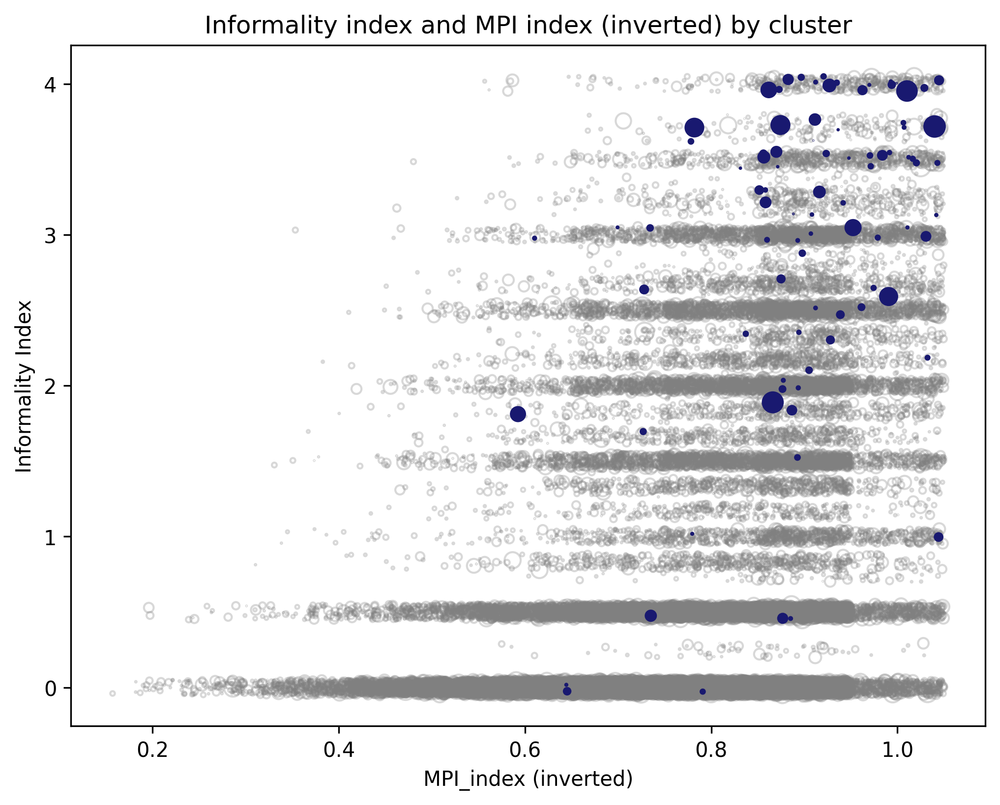

In [65]:
# Separate the data into two DataFrames based on the cluster
emicron_0 = emicron[emicron['cluster'] == 0]
emicron_other = emicron[emicron['cluster'] != 0]

# Add some random noise to create dispersion
jitter = 0.05 # adjust this value to change the amount of jitter
emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_other['mpi_index_rev_jittered'] = emicron_other['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))
emicron_other['II_jittered'] = emicron_other['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))

# Normalize 'F_EXP' for better visualization
size_0 = (emicron_0['F_EXP'] - emicron_0['F_EXP'].min()) / (emicron_0['F_EXP'].max() - emicron_0['F_EXP'].min()) * 100
size_other = (emicron_other['F_EXP'] - emicron_other['F_EXP'].min()) / (emicron_other['F_EXP'].max() - emicron_other['F_EXP'].min()) * 100

plt.figure(figsize=(8, 6), dpi=300)
# Use matplotlib to create the scatter plot
plt.scatter(emicron_other['mpi_index_rev_jittered'], emicron_other['II_jittered'], 
            edgecolors='grey', facecolors='none', s=size_other, alpha=0.3)
plt.scatter(emicron_0['mpi_index_rev_jittered'], emicron_0['II_jittered'], 
            edgecolors='#191970', facecolors='#191970', s=size_0)

plt.title('Informality index and MPI index (inverted) by cluster')
plt.xlabel('MPI_index (inverted)')
plt.ylabel('Informality Index')
plt.show()

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/12716858.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/12716858.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))


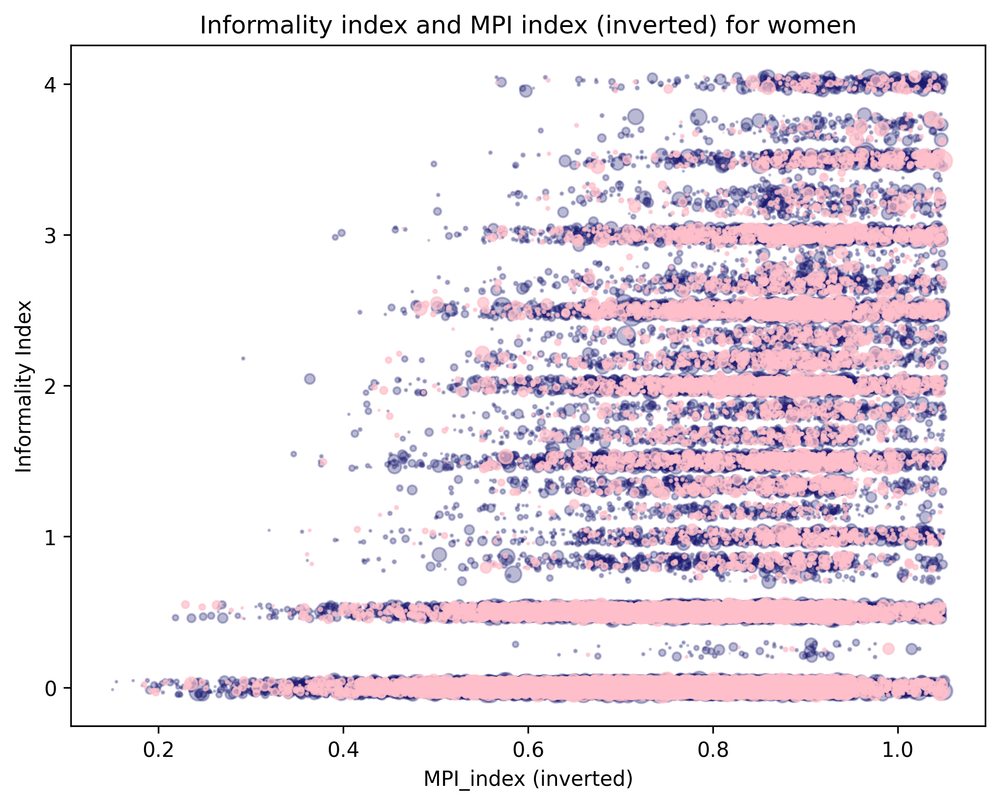

In [66]:
# Separate the data into two DataFrames based on the cluster
emicron_0 = emicron[emicron['P35'] == 2]
emicron_other = emicron[emicron['P35'] != 0]

# Add some random noise to create dispersion
jitter = 0.05 # adjust this value to change the amount of jitter
emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_other['mpi_index_rev_jittered'] = emicron_other['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))
emicron_other['II_jittered'] = emicron_other['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))

# Normalize 'F_EXP' for better visualization
size_0 = (emicron_0['F_EXP'] - emicron_0['F_EXP'].min()) / (emicron_0['F_EXP'].max() - emicron_0['F_EXP'].min()) * 100
size_other = (emicron_other['F_EXP'] - emicron_other['F_EXP'].min()) / (emicron_other['F_EXP'].max() - emicron_other['F_EXP'].min()) * 100

plt.figure(figsize=(8, 6), dpi=300)
# Use matplotlib to create the scatter plot
plt.scatter(emicron_other['mpi_index_rev_jittered'], emicron_other['II_jittered'], 
            edgecolors='#191970', facecolors='#191970', s=size_other, alpha=0.3)
plt.scatter(emicron_0['mpi_index_rev_jittered'], emicron_0['II_jittered'], 
            edgecolors='pink', facecolors='pink', s=size_0, alpha=0.7)

plt.title('Informality index and MPI index (inverted) for women')
plt.xlabel('MPI_index (inverted)')
plt.ylabel('Informality Index')
plt.show()

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/1283495560.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/1283495560.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))


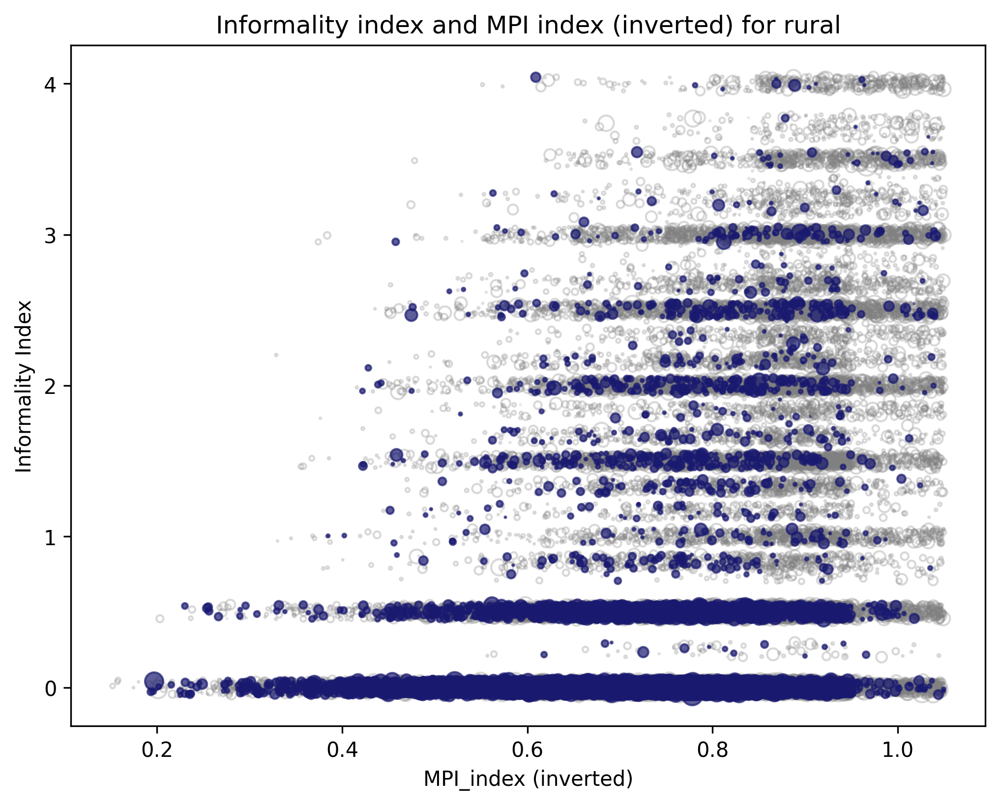

In [67]:
# Separate the data into two DataFrames based on the cluster
emicron_0 = emicron[emicron['CLASE_TE'] == 2]
emicron_other = emicron[emicron['CLASE_TE'] != 0]

# Add some random noise to create dispersion
jitter = 0.05 # adjust this value to change the amount of jitter
emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_other['mpi_index_rev_jittered'] = emicron_other['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))
emicron_other['II_jittered'] = emicron_other['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))

# Normalize 'F_EXP' for better visualization
size_0 = (emicron_0['F_EXP'] - emicron_0['F_EXP'].min()) / (emicron_0['F_EXP'].max() - emicron_0['F_EXP'].min()) * 100
size_other = (emicron_other['F_EXP'] - emicron_other['F_EXP'].min()) / (emicron_other['F_EXP'].max() - emicron_other['F_EXP'].min()) * 100

plt.figure(figsize=(8, 6), dpi=300)
# Use matplotlib to create the scatter plot
plt.scatter(emicron_other['mpi_index_rev_jittered'], emicron_other['II_jittered'], 
            edgecolors='grey', facecolors='none', s=size_other, alpha=0.3)
plt.scatter(emicron_0['mpi_index_rev_jittered'], emicron_0['II_jittered'], 
            edgecolors='#191970', facecolors='#191970', s=size_0, alpha=0.7)

plt.title('Informality index and MPI index (inverted) for rural')
plt.xlabel('MPI_index (inverted)')
plt.ylabel('Informality Index')
plt.show()

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3827195189.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3827195189.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))


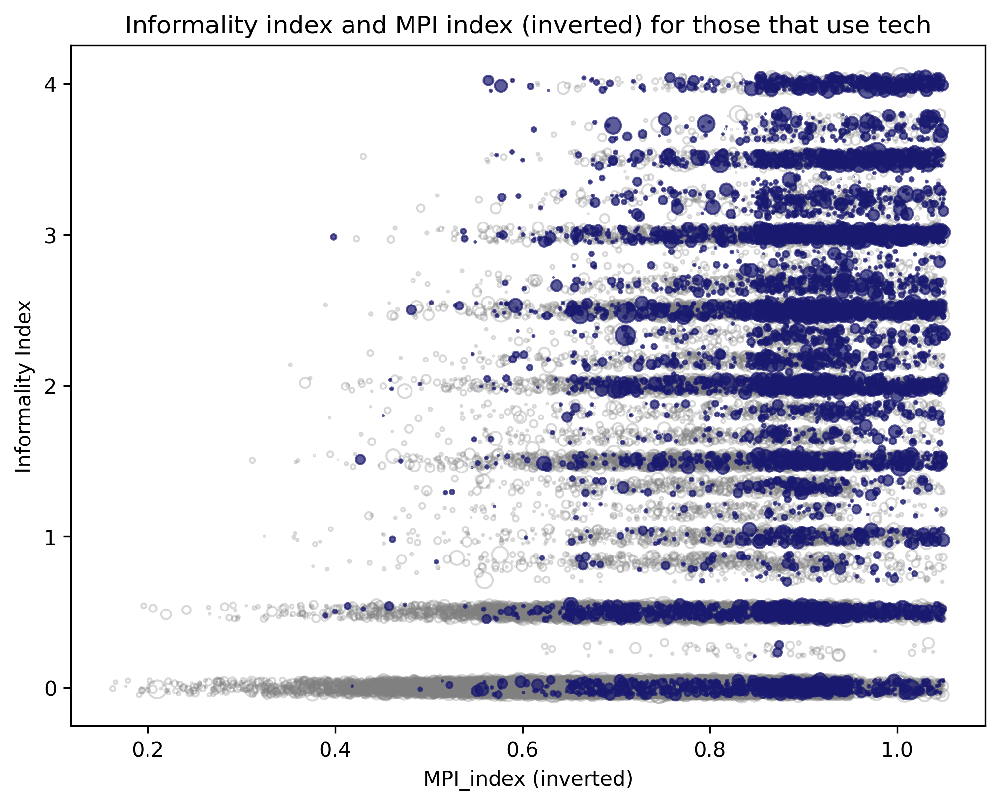

In [68]:
# Separate the data into two DataFrames based on the cluster
emicron_0 = emicron[emicron['P4001'] == 1]
emicron_other = emicron[emicron['P4001'] != 0]

# Add some random noise to create dispersion
jitter = 0.05 # adjust this value to change the amount of jitter
emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_other['mpi_index_rev_jittered'] = emicron_other['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))
emicron_other['II_jittered'] = emicron_other['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))

# Normalize 'F_EXP' for better visualization
size_0 = (emicron_0['F_EXP'] - emicron_0['F_EXP'].min()) / (emicron_0['F_EXP'].max() - emicron_0['F_EXP'].min()) * 100
size_other = (emicron_other['F_EXP'] - emicron_other['F_EXP'].min()) / (emicron_other['F_EXP'].max() - emicron_other['F_EXP'].min()) * 100

plt.figure(figsize=(8, 6), dpi=300)
# Use matplotlib to create the scatter plot
plt.scatter(emicron_other['mpi_index_rev_jittered'], emicron_other['II_jittered'], 
            edgecolors='grey', facecolors='none', s=size_other, alpha=0.3)
plt.scatter(emicron_0['mpi_index_rev_jittered'], emicron_0['II_jittered'], 
            edgecolors='#191970', facecolors='#191970', s=size_0, alpha=0.7)

plt.title('Informality index and MPI index (inverted) for those that use tech')
plt.xlabel('MPI_index (inverted)')
plt.ylabel('Informality Index')
plt.show()

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3133468569.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3133468569.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))


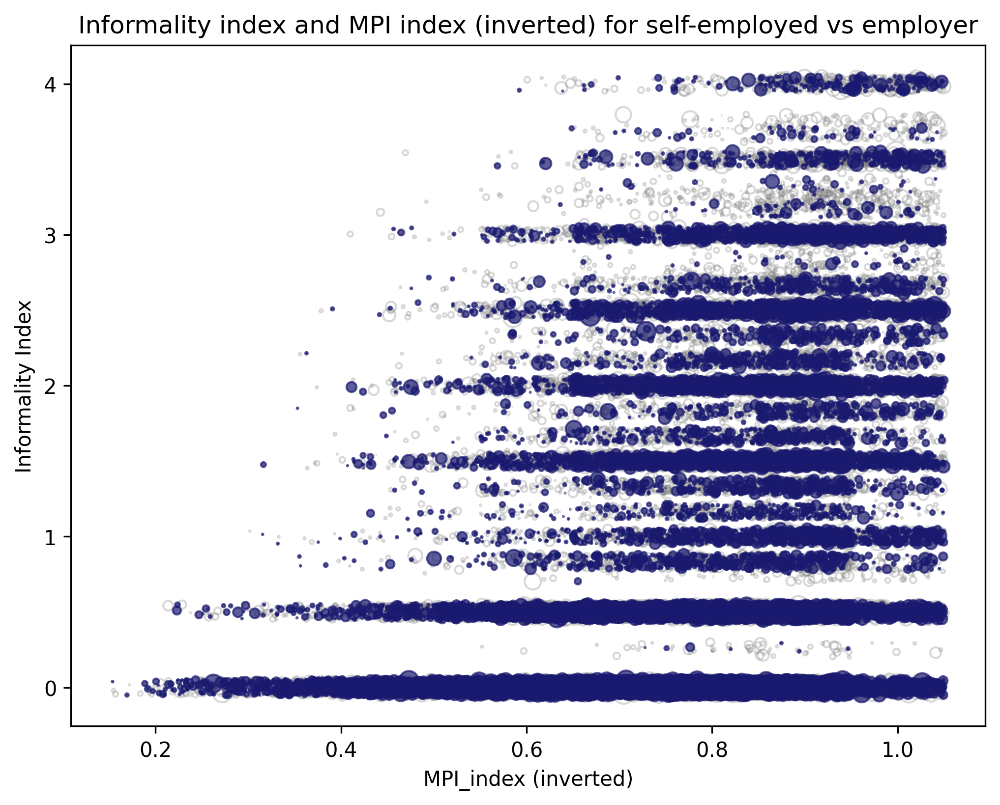

In [69]:
# Separate the data into two DataFrames based on the cluster
emicron_0 = emicron[emicron['P3031'] == 2]
emicron_other = emicron[emicron['P3031'] != 0]

# Add some random noise to create dispersion
jitter = 0.05 # adjust this value to change the amount of jitter
emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_other['mpi_index_rev_jittered'] = emicron_other['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))
emicron_other['II_jittered'] = emicron_other['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))

# Normalize 'F_EXP' for better visualization
size_0 = (emicron_0['F_EXP'] - emicron_0['F_EXP'].min()) / (emicron_0['F_EXP'].max() - emicron_0['F_EXP'].min()) * 100
size_other = (emicron_other['F_EXP'] - emicron_other['F_EXP'].min()) / (emicron_other['F_EXP'].max() - emicron_other['F_EXP'].min()) * 100

plt.figure(figsize=(8, 6), dpi=300)
# Use matplotlib to create the scatter plot
plt.scatter(emicron_other['mpi_index_rev_jittered'], emicron_other['II_jittered'], 
            edgecolors='grey', facecolors='none', s=size_other, alpha=0.3)
plt.scatter(emicron_0['mpi_index_rev_jittered'], emicron_0['II_jittered'], 
            edgecolors='#191970', facecolors='#191970', s=size_0, alpha=0.7)

plt.title('Informality index and MPI index (inverted) for self-employed vs employer')
plt.xlabel('MPI_index (inverted)')
plt.ylabel('Informality Index')
plt.show()

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3264720282.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3264720282.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))


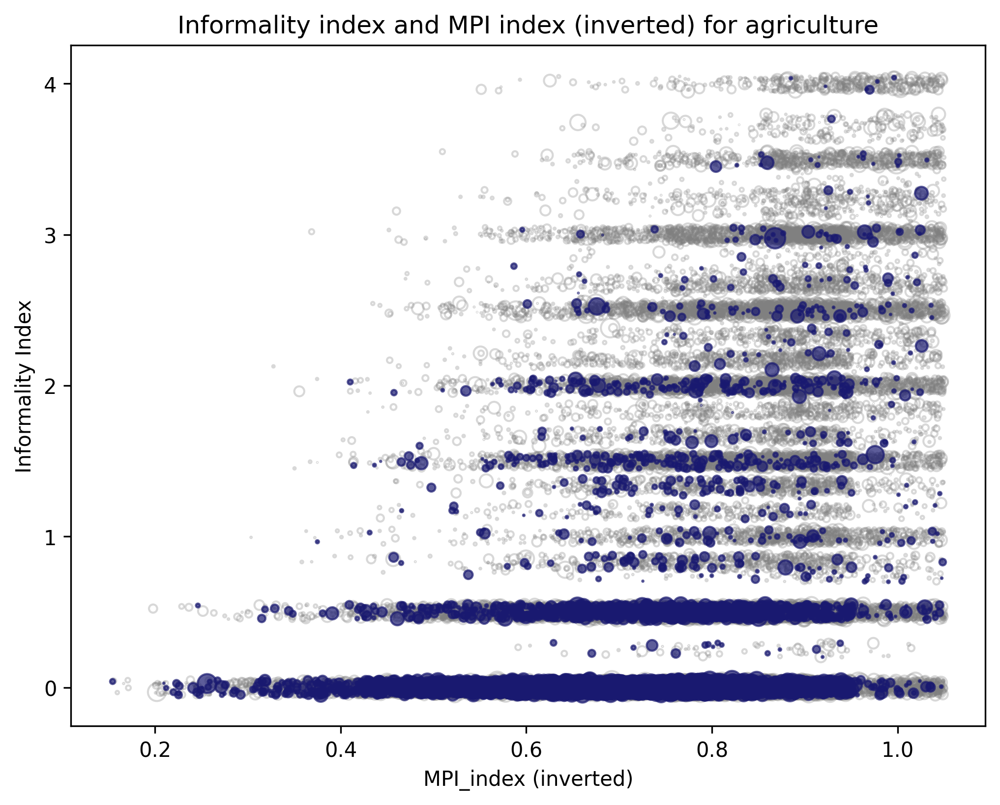

In [70]:
# Separate the data into two DataFrames based on the cluster
emicron_0 = emicron[emicron['GRUPOS4'] == 1]
emicron_other = emicron[emicron['GRUPOS4'] != 0]

# Add some random noise to create dispersion
jitter = 0.05 # adjust this value to change the amount of jitter
emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_other['mpi_index_rev_jittered'] = emicron_other['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))
emicron_other['II_jittered'] = emicron_other['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))

# Normalize 'F_EXP' for better visualization
size_0 = (emicron_0['F_EXP'] - emicron_0['F_EXP'].min()) / (emicron_0['F_EXP'].max() - emicron_0['F_EXP'].min()) * 100
size_other = (emicron_other['F_EXP'] - emicron_other['F_EXP'].min()) / (emicron_other['F_EXP'].max() - emicron_other['F_EXP'].min()) * 100

plt.figure(figsize=(8, 6), dpi=300)
# Use matplotlib to create the scatter plot
plt.scatter(emicron_other['mpi_index_rev_jittered'], emicron_other['II_jittered'], 
            edgecolors='grey', facecolors='none', s=size_other, alpha=0.3)
plt.scatter(emicron_0['mpi_index_rev_jittered'], emicron_0['II_jittered'], 
            edgecolors='#191970', facecolors='#191970', s=size_0, alpha=0.7)

plt.title('Informality index and MPI index (inverted) for agriculture')
plt.xlabel('MPI_index (inverted)')
plt.ylabel('Informality Index')
plt.show()

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3869991955.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_51583/3869991955.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
/var/folders/4h/c_6klx0d0bd723sm

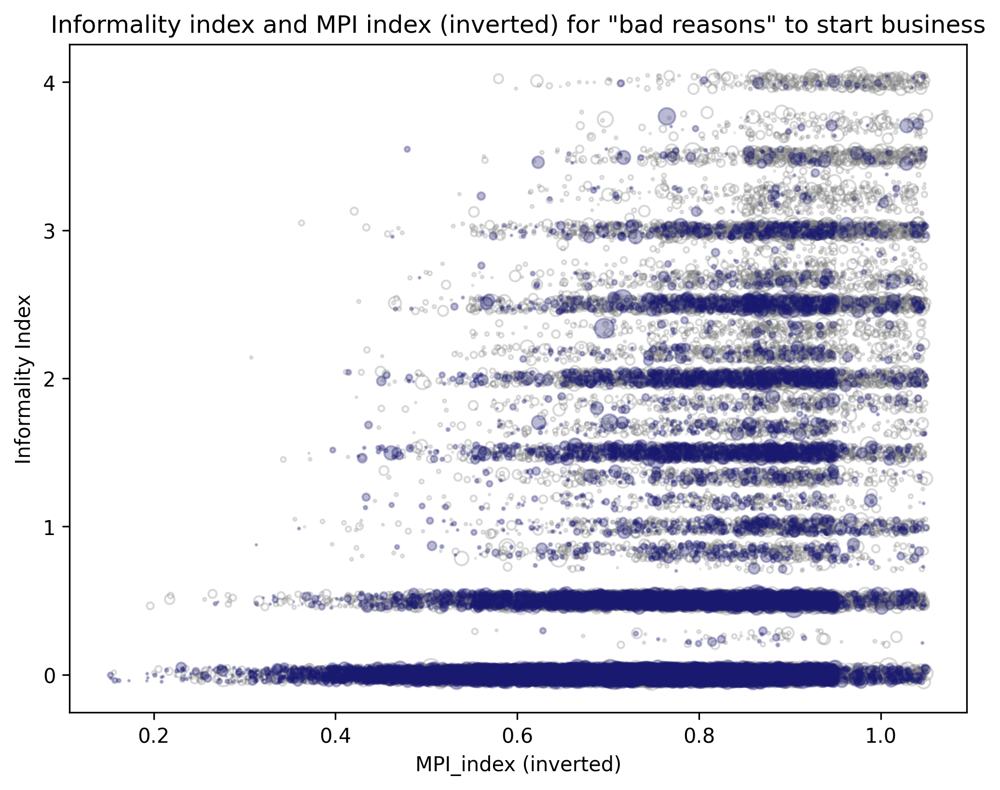

In [71]:
# Separate the data into two DataFrames based on the cluster
emicron_0 = emicron[emicron['P3051'].isin([1, 6])]
emicron_other = emicron[emicron['P3051'].isin([2, 3, 4, 5, 7])]

# Add some random noise to create dispersion
jitter = 0.05 # adjust this value to change the amount of jitter
emicron_0['mpi_index_rev_jittered'] = emicron_0['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_0['II_jittered'] = emicron_0['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_0))
emicron_other['mpi_index_rev_jittered'] = emicron_other['mpi_index_rev'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))
emicron_other['II_jittered'] = emicron_other['II'] + np.random.uniform(-jitter, jitter, size=len(emicron_other))

# Normalize 'F_EXP' for better visualization
size_0 = (emicron_0['F_EXP'] - emicron_0['F_EXP'].min()) / (emicron_0['F_EXP'].max() - emicron_0['F_EXP'].min()) * 100
size_other = (emicron_other['F_EXP'] - emicron_other['F_EXP'].min()) / (emicron_other['F_EXP'].max() - emicron_other['F_EXP'].min()) * 100

plt.figure(figsize=(8, 6), dpi=300)
# Use matplotlib to create the scatter plot
plt.scatter(emicron_other['mpi_index_rev_jittered'], emicron_other['II_jittered'], 
            edgecolors='grey', facecolors='none', s=size_other, alpha=0.3, label='Good')
plt.scatter(emicron_0['mpi_index_rev_jittered'], emicron_0['II_jittered'], 
            edgecolors='#191970', facecolors='#191970', s=size_0, alpha=0.3, label='Bad')

plt.title('Informality index and MPI index (inverted) for "bad reasons" to start business')
plt.xlabel('MPI_index (inverted)')
plt.ylabel('Informality Index')
plt.show()

In [72]:
emicron['tech']=np.where(emicron['P4001']==1, 1,0)

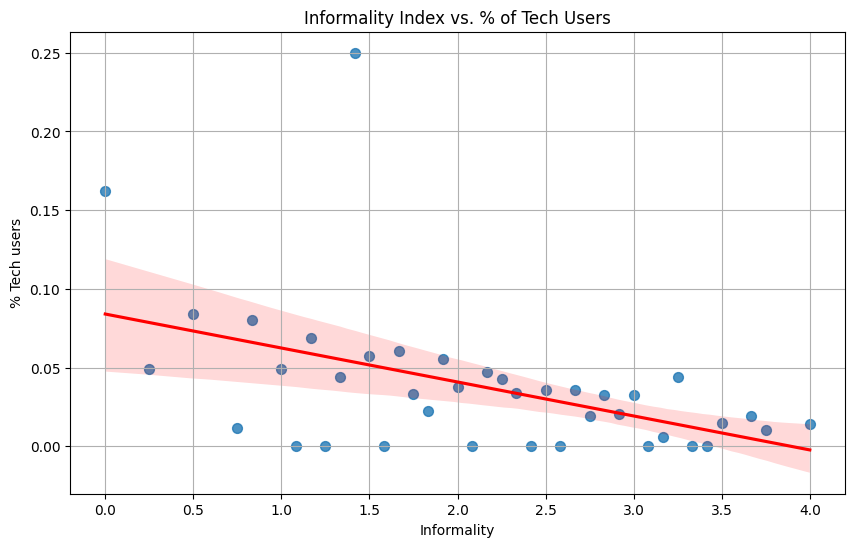

In [73]:
grouped_data = emicron.groupby('II')['mpi_literacy'].mean().reset_index()

# Plot scatter plot with regression line
plt.figure(figsize=(10, 6))
sns.regplot(x='II', y='mpi_literacy', data=grouped_data, scatter_kws={'s': 50}, line_kws={'color': 'red'})

# Add labels and title
plt.xlabel('Informality')
plt.ylabel('% Tech users')
plt.title('Informality Index vs. % of Tech Users')

# Show plot
plt.grid(True)
plt.show()

In [74]:
table = emicron.groupby('cluster')[['II', 'mpi_poor', 'II_D1', 'II_D2', 'II_D3', 'II_D4']].mean()

In [75]:
table

,II,mpi_poor,II_D1,II_D2,II_D3,II_D4
cluster,,,,,,
0,2.940476,0.043956,0.851648,0.480769,0.783883,0.824176
1,0.185017,0.178983,0.031717,0.015689,0.051125,0.086486
2,0.163657,0.581667,0.016667,0.003750,0.022963,0.120278
3,2.230504,0.053938,0.781728,0.049902,0.861827,0.537047
4,0.249962,0.131509,0.028268,0.008922,0.044823,0.167949
5,0.156811,0.336929,0.027013,0.005251,0.042041,0.082505
6,2.744335,0.015797,0.647439,0.778842,0.735599,0.582456


In [76]:
emicron.groupby('cluster')['F_EXP'].sum()

cluster
0    5.642624e+03
1    1.244147e+06
2    1.887760e+05
3    6.159142e+05
4    1.224363e+06
5    1.153139e+06
6    3.004543e+05
Name: F_EXP, dtype: float64

In [77]:
emicron[emicron['cluster']==3]['II_D2'].describe()

count    10716.000000
mean         0.049902
std          0.142351
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: II_D2, dtype: float64

In [78]:
emicron[emicron['cluster']==6]['II_D3'].value_counts()

II_D3
1.000000    2607
0.000000     685
0.666667     513
0.333333     373
Name: count, dtype: int64

In [79]:
mpi.groupby('edu_level')['II'].mean()

edu_level
1.0     0.128132
2.0     0.444444
3.0     0.390196
4.0     0.409453
5.0     0.580775
6.0     0.771984
7.0     0.553922
8.0     0.804095
9.0     1.146968
10.0    1.334258
11.0    1.969973
12.0    2.068807
13.0    1.923333
99.0    0.750000
Name: II, dtype: float64